<a href="https://colab.research.google.com/github/WTFjarux/Level-6--Artificial-Intelligence/blob/main/2438454_SurajPandey_Code_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ── Install / upgrade key packages (run once on Colab) ──────────────────────
!pip install -q tensorflow keras scikit-learn matplotlib seaborn pillow
print("All packages ready!")

All packages ready!


In [ ]:
# ── Mount Google Drive (if using Colab + Drive) ─────────────────────────────
# Uncomment the two lines below if your dataset is in Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

# ── Upload dataset zip directly to Colab ─────────────────────────────────────
# Uncomment below to upload manually in Colabz
# from google.colab import files
# uploaded = files.upload()  # select your zip file

In [ ]:
# ── Mount Google Drive ──────────────────────────────────────────────────────
from google.colab import drive
drive.mount('/content/drive',force_remount=True)
print('Google Drive mounted successfully!')

Mounted at /content/drive
Google Drive mounted successfully!


In [ ]:
# ── Unzip Dataset from Google Drive ─────────────────────────────────────────
import zipfile, os

# ✅ Path to your zip file in Google Drive
ZIP_PATH   = '/content/drive/MyDrive/Level 6 - Aritficial Intelligence /Assesment Part 2/Flower Classification.zip'
EXTRACT_TO = '/content/drive/MyDrive/Level 6 - Aritficial Intelligence /Assesment Part 2'

# Verify zip exists before extracting
if not os.path.exists(ZIP_PATH):
    raise FileNotFoundError(f'ZIP not found at: {ZIP_PATH}\nCheck your Drive path!')

if not os.path.exists(EXTRACT_TO):
    print('Extracting zip file... (this may take 1-2 minutes)')
    with zipfile.ZipFile(ZIP_PATH, 'r') as z:
        z.extractall(EXTRACT_TO)
    print(f'✅ Extracted to {EXTRACT_TO}')
else:
    print('✅ Already extracted — skipping.')

# ── Locate Train / Test directories ─────────────────────────────────────────
BASE_DIR  = os.path.join(EXTRACT_TO, 'Flower Classification')
TRAIN_DIR = os.path.join(BASE_DIR, 'Train')
TEST_DIR  = os.path.join(BASE_DIR, 'Test')

# Verify folders exist
assert os.path.exists(TRAIN_DIR), f'Train dir not found: {TRAIN_DIR}'
assert os.path.exists(TEST_DIR),  f'Test dir not found: {TEST_DIR}'

print(f'Train dir : {TRAIN_DIR}')
print(f'Test  dir : {TEST_DIR}')
print(f'Classes   : {sorted(os.listdir(TRAIN_DIR))}')

# Count total images
total = sum(len(os.listdir(os.path.join(TRAIN_DIR, c))) for c in os.listdir(TRAIN_DIR))
print(f'Total training images: {total}')

Extracting zip file... (this may take 1-2 minutes)
✅ Extracted to /content/flower_data
Train dir : /content/flower_data/Flower Classification/Train
Test  dir : /content/flower_data/Flower Classification/Test
Classes   : ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Total training images: 4312


In [ ]:
# ── Core Imports ─────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import warnings, time, random
warnings.filterwarnings('ignore')

# TensorFlow / Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2, ResNet50V2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.optimizers import Adam, SGD

# Sklearn metrics
from sklearn.metrics import (
    classification_report, confusion_matrix,
    ConfusionMatrixDisplay, accuracy_score
)

# ── Reproducibility ──────────────────────────────────────────────────────────
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

print(f'TensorFlow version : {tf.__version__}')
print(f'Keras version      : {keras.__version__}')
print(f'GPU available      : {tf.config.list_physical_devices("GPU")}')

TensorFlow version : 2.20.0
Keras version      : 3.13.2
GPU available      : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]



## Section 1 — Data Understanding, Analysis & Visualization

In [ ]:
# ── 1.1  Count images per class ──────────────────────────────────────────────
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
class_counts = {cls: len(os.listdir(os.path.join(TRAIN_DIR, cls))) for cls in CLASS_NAMES}

print('=== Dataset Overview ===')
print(f'Number of classes : {len(CLASS_NAMES)}')
print(f'Class names       : {CLASS_NAMES}')
total = 0
for cls, cnt in class_counts.items():
    print(f'  {cls:12s} : {cnt} images')
    total += cnt
print(f'  {"TOTAL":12s} : {total} images')

=== Dataset Overview ===
Number of classes : 5
Class names       : ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
  daisy        : 763 images
  dandelion    : 1051 images
  rose         : 783 images
  sunflower    : 732 images
  tulip        : 983 images
  TOTAL        : 4312 images


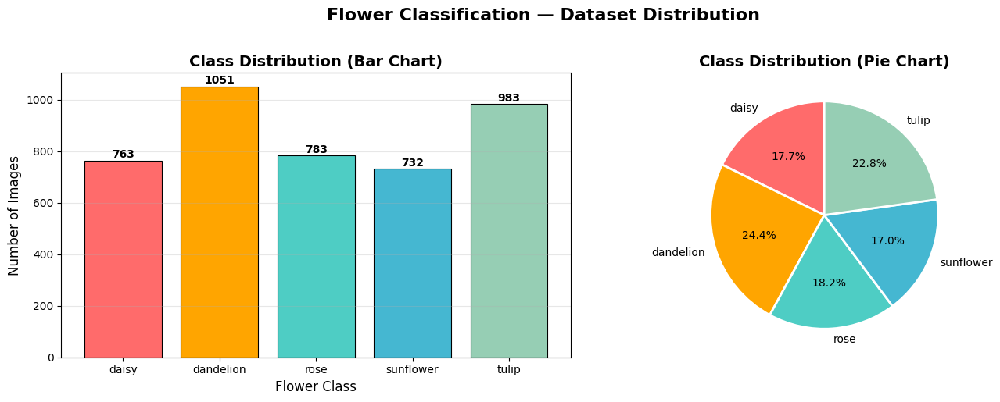


Observation: Dandelion (~1051) is the most represented class; Sunflower (~732) the least.
Mild class imbalance present — we will address this with data augmentation and class weights.


In [ ]:
# ── 1.2  Class distribution bar + pie chart ──────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

colors = ['#FF6B6B', '#FFA500', '#4ECDC4', '#45B7D1', '#96CEB4']

# Bar chart
axes[0].bar(class_counts.keys(), class_counts.values(), color=colors, edgecolor='black', linewidth=0.8)
axes[0].set_title('Class Distribution (Bar Chart)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Flower Class', fontsize=12)
axes[0].set_ylabel('Number of Images', fontsize=12)
for i, (cls, cnt) in enumerate(class_counts.items()):
    axes[0].text(i, cnt + 10, str(cnt), ha='center', fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

# Pie chart
axes[1].pie(class_counts.values(), labels=class_counts.keys(),
            colors=colors, autopct='%1.1f%%', startangle=90,
            wedgeprops=dict(edgecolor='white', linewidth=2))
axes[1].set_title('Class Distribution (Pie Chart)', fontsize=14, fontweight='bold')

plt.suptitle('Flower Classification — Dataset Distribution', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print('\nObservation: Dandelion (~1051) is the most represented class; Sunflower (~732) the least.')
print('Mild class imbalance present — we will address this with data augmentation and class weights.')

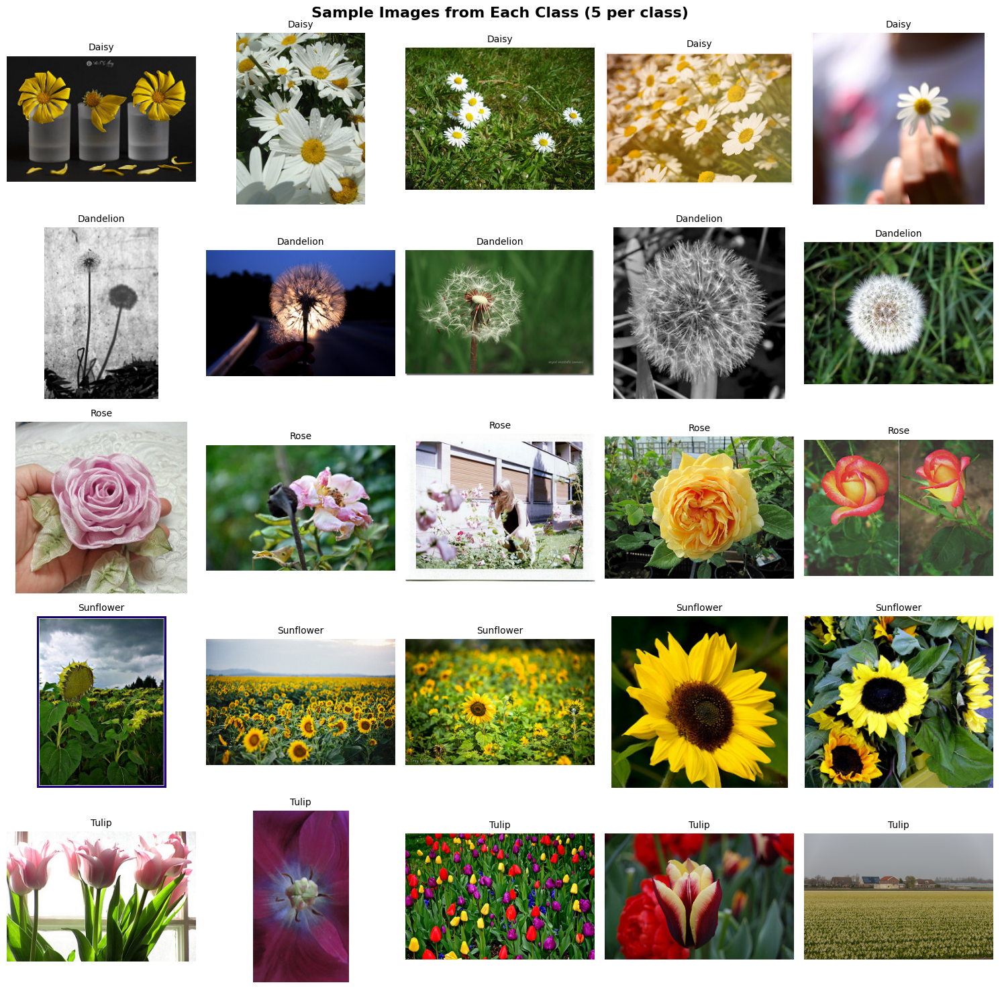

In [ ]:
# ── 1.3  Sample image grid ───────────────────────────────────────────────────
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
fig.suptitle('Sample Images from Each Class (5 per class)', fontsize=16, fontweight='bold')

for row, cls in enumerate(CLASS_NAMES):
    cls_dir = os.path.join(TRAIN_DIR, cls)
    # skip 10-byte placeholder files
    imgs = [f for f in os.listdir(cls_dir)
            if f.endswith('.jpg') and os.path.getsize(os.path.join(cls_dir, f)) > 1000]
    sample = random.sample(imgs, min(5, len(imgs)))
    for col, fname in enumerate(sample):
        img = mpimg.imread(os.path.join(cls_dir, fname))
        axes[row][col].imshow(img)
        axes[row][col].set_title(cls.capitalize(), fontsize=10)
        axes[row][col].axis('off')

plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

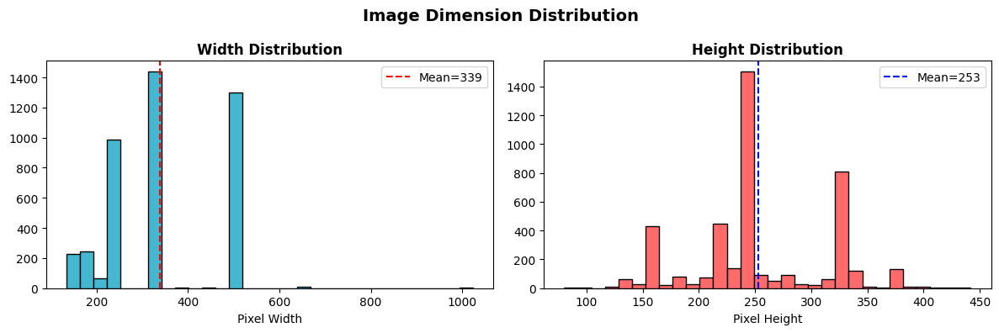

Average width: 339px | Average height: 253px
→ We will resize all images to 128×128 for Parts A, and 224×224 for Transfer Learning.


In [ ]:
# ── 1.4  Image size distribution ────────────────────────────────────────────
from PIL import Image as PILImage

widths, heights = [], []
for cls in CLASS_NAMES:
    cls_dir = os.path.join(TRAIN_DIR, cls)
    for fname in os.listdir(cls_dir):
        fpath = os.path.join(cls_dir, fname)
        if os.path.getsize(fpath) < 1000:
            continue
        try:
            with PILImage.open(fpath) as im:
                widths.append(im.width)
                heights.append(im.height)
        except:
            pass

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(widths, bins=30, color='#45B7D1', edgecolor='black')
axes[0].set_title('Width Distribution', fontweight='bold')
axes[0].set_xlabel('Pixel Width')
axes[0].axvline(np.mean(widths), color='red', linestyle='--', label=f'Mean={np.mean(widths):.0f}')
axes[0].legend()

axes[1].hist(heights, bins=30, color='#FF6B6B', edgecolor='black')
axes[1].set_title('Height Distribution', fontweight='bold')
axes[1].set_xlabel('Pixel Height')
axes[1].axvline(np.mean(heights), color='blue', linestyle='--', label=f'Mean={np.mean(heights):.0f}')
axes[1].legend()

plt.suptitle('Image Dimension Distribution', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('image_dimensions.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Average width: {np.mean(widths):.0f}px | Average height: {np.mean(heights):.0f}px')
print('→ We will resize all images to 128×128 for Parts A, and 224×224 for Transfer Learning.')


## Section 2 — Data Preprocessing & Augmentation

In [ ]:
# ── 2.1  Hyperparameters ─────────────────────────────────────────────────────
IMG_SIZE    = 128       # resize for Parts A
BATCH_SIZE  = 32
NUM_CLASSES = 5
VAL_SPLIT   = 0.20     # 80/20 train-validation split

# ── 2.2  Compute class weights (handle mild imbalance) ───────────────────────
from sklearn.utils.class_weight import compute_class_weight
counts_arr = np.array(list(class_counts.values()))
total_imgs = counts_arr.sum()
class_weight_dict = {i: total_imgs / (NUM_CLASSES * cnt)
                     for i, cnt in enumerate(counts_arr)}
print('Class weights:', class_weight_dict)

Class weights: {0: np.float64(1.1302752293577982), 1: np.float64(0.8205518553758325), 2: np.float64(1.101404853128991), 3: np.float64(1.1781420765027322), 4: np.float64(0.8773143438453713)}


In [ ]:
# ── 2.3  Data generators for Part A (128×128) ────────────────────────────────
# Training generator: heavy augmentation
train_datagen = ImageDataGenerator(
    rescale           = 1./255,
    validation_split  = VAL_SPLIT,
    rotation_range    = 40,
    width_shift_range = 0.2,
    height_shift_range= 0.2,
    shear_range       = 0.2,
    zoom_range        = 0.2,
    horizontal_flip   = True,
    vertical_flip     = True,
    brightness_range  = [0.8, 1.2],
    fill_mode         = 'nearest'
)

# Validation generator: only rescale (no augmentation)
val_datagen = ImageDataGenerator(
    rescale          = 1./255,
    validation_split = VAL_SPLIT
)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size  = (IMG_SIZE, IMG_SIZE),
    batch_size   = BATCH_SIZE,
    class_mode   = 'categorical',
    subset       = 'training',
    seed         = SEED
)

val_gen = val_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size  = (IMG_SIZE, IMG_SIZE),
    batch_size   = BATCH_SIZE,
    class_mode   = 'categorical',
    subset       = 'validation',
    seed         = SEED
)

CLASS_INDICES = train_gen.class_indices
IDX_TO_CLASS  = {v: k for k, v in CLASS_INDICES.items()}

print(f'Training samples   : {train_gen.samples}')
print(f'Validation samples : {val_gen.samples}')
print(f'Class indices      : {CLASS_INDICES}')

Found 3452 images belonging to 5 classes.
Found 860 images belonging to 5 classes.
Training samples   : 3452
Validation samples : 860
Class indices      : {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}


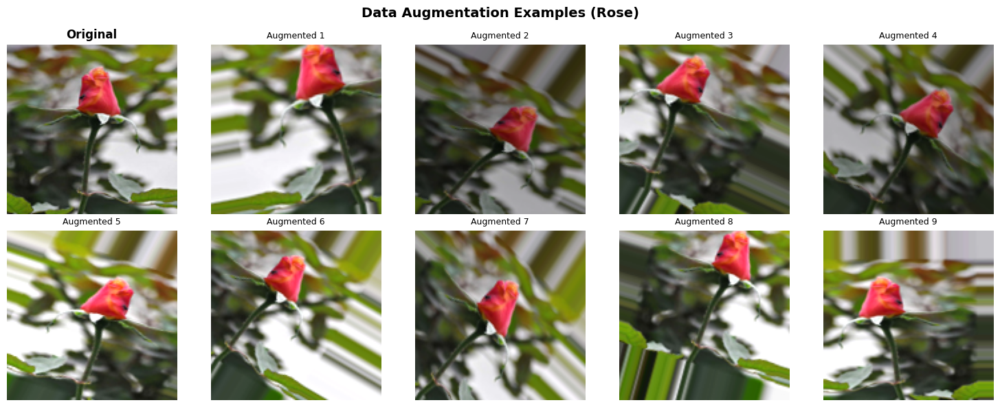

In [ ]:
# ── 2.4  Visualize Augmented Images ─────────────────────────────────────────
aug_gen = ImageDataGenerator(
    rotation_range    = 40,
    width_shift_range = 0.2,
    height_shift_range= 0.2,
    shear_range       = 0.2,
    zoom_range        = 0.2,
    horizontal_flip   = True,
    brightness_range  = [0.7, 1.3]
)

rose_dir = os.path.join(TRAIN_DIR, 'rose')
valid_roses = [
    f for f in os.listdir(rose_dir)
    if f.lower().endswith('.jpg') and os.path.getsize(os.path.join(rose_dir, f)) > 1000
]

if not valid_roses:
    raise FileNotFoundError(f"No valid rose images found in {rose_dir}")

# ── FIXED: pick a random rose and verify it opens correctly ──────────────────
sample_img_path = None
for fname in random.sample(valid_roses, len(valid_roses)):  # ← only change here
    fpath = os.path.join(rose_dir, fname)
    try:
        with PILImage.open(fpath) as test_img:
            test_img.verify()
        sample_img_path = fpath
        break
    except Exception:
        continue

if sample_img_path is None:
    raise FileNotFoundError("No valid rose images found after verification!")

# Load image in 0–255 range (uint8), then make a float copy for display
raw_img = np.array(PILImage.open(sample_img_path).convert('RGB').resize((IMG_SIZE, IMG_SIZE)))

img_arr_255 = np.expand_dims(raw_img.astype(np.float32), axis=0)
img_arr_norm = raw_img / 255.0

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle('Data Augmentation Examples (Rose)', fontsize=14, fontweight='bold')

axes[0][0].imshow(img_arr_norm)
axes[0][0].set_title('Original', fontweight='bold')
axes[0][0].axis('off')

aug_iter = aug_gen.flow(img_arr_255, batch_size=1, seed=42)

for i, ax in enumerate(axes.flatten()[1:], 1):
    aug_img = next(aug_iter)[0]
    aug_img_norm = aug_img / 255.0
    ax.imshow(np.clip(aug_img_norm, 0, 1))
    ax.set_title(f'Augmented {i}', fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.savefig('augmented_samples.png', dpi=150, bbox_inches='tight')
plt.show()

##Section 3 — Part A: Baseline CNN Model (from Scratch)



In [ ]:
# ── Helper: plot training curves ────────────────────────────────────────────
def plot_history(history, title='Model Training History', save_name=None):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(title, fontsize=14, fontweight='bold')

    # Accuracy
    axes[0].plot(history.history['accuracy'],     label='Train Acc',  color='#45B7D1', linewidth=2)
    axes[0].plot(history.history['val_accuracy'], label='Val Acc',    color='#FF6B6B', linewidth=2)
    axes[0].set_title('Accuracy over Epochs')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
    axes[0].legend(); axes[0].grid(alpha=0.3)

    # Loss
    axes[1].plot(history.history['loss'],     label='Train Loss', color='#45B7D1', linewidth=2)
    axes[1].plot(history.history['val_loss'], label='Val Loss',   color='#FF6B6B', linewidth=2)
    axes[1].set_title('Loss over Epochs')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
    axes[1].legend(); axes[1].grid(alpha=0.3)

    plt.tight_layout()
    if save_name:
        plt.savefig(save_name, dpi=150, bbox_inches='tight')
    plt.show()


# ── Helper: evaluate model ───────────────────────────────────────────────────
def evaluate_model(model, gen, model_name='Model'):
    gen.reset()
    preds     = model.predict(gen, verbose=0)        # verbose=0 hides predict bar
    y_pred    = np.argmax(preds, axis=1)
    y_true    = gen.classes
    labels    = list(gen.class_indices.keys())

    acc = accuracy_score(y_true, y_pred)

    # ── Clean console output ─────────────────────────────────────────────────
    sep = '─' * 50
    print(f'\n╔{"═"*50}╗')
    print(f'║{"  📊  " + model_name + " Evaluation":^50}║')
    print(f'╚{"═"*50}╝')

    print(f'\n  {sep}')
    print(f'  📌  Overall Accuracy : {acc*100:.2f}%')
    print(f'  {sep}')

    print(f'\n  📋  Classification Report:\n')
    report = classification_report(y_true, y_pred, target_names=labels)
    for line in report.splitlines():
        print(f'      {line}')

    print(f'\n  {sep}')
    print(f'  📊  Confusion Matrix  → saved as cm_{model_name.replace(" ","_")}.png')
    print(f'  {sep}\n')

    # ── Confusion matrix plot ─────────────────────────────────────────────────
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(ax=ax, cmap='Blues', colorbar=False)
    ax.set_title(f'{model_name} — Confusion Matrix', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'cm_{model_name.replace(" ","_")}.png', dpi=150, bbox_inches='tight')
    plt.show()
    return acc, y_true, y_pred


# ── Status message ────────────────────────────────────────────────────────────
print('╔══════════════════════════════════════════╗')
print('║         ✅  Helper Functions Ready        ║')
print('╠══════════════════════════════════════════╣')
print('║  📈  plot_history()    → training curves  ║')
print('║  🧪  evaluate_model()  → full evaluation  ║')
print('╚══════════════════════════════════════════╝')

╔══════════════════════════════════════════╗
║         ✅  Helper Functions Ready        ║
╠══════════════════════════════════════════╣
║  📈  plot_history()    → training curves  ║
║  🧪  evaluate_model()  → full evaluation  ║
╚══════════════════════════════════════════╝


In [ ]:
# ── 3.1  Baseline CNN Architecture ──────────────────────────────────────────
# 3 Conv+Pool blocks → 3 Dense layers → Output

def build_baseline_cnn(input_shape=(128, 128, 3), num_classes=5):
    model = models.Sequential(name='Baseline_CNN')

    # Block 1
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same',
                            input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))

    # Block 2
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Block 3
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten → 3 FCN layers
    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dense(128, activation='relu'))

    # Output
    model.add(layers.Dense(num_classes, activation='softmax'))
    return model


baseline_model = build_baseline_cnn()
baseline_model.compile(
    optimizer = Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)
baseline_model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,035,845 (64.99 MB)

 Trainable params: 17,035,845 (64.99 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# ── FIX: Clean corrupt images before training ────────────────────────────────
import os
from PIL import Image as PILImage

def clean_corrupt_images(directory, min_size=1000):
    """
    Scans all images in directory, removes or skips corrupt ones.
    Returns count of removed files.
    """
    removed   = 0
    kept      = 0
    corrupt   = []

    print(f'\n🔍 Scanning for corrupt images in: {directory}')
    print('─' * 55)

    for class_name in sorted(os.listdir(directory)):
        class_dir = os.path.join(directory, class_name)
        if not os.path.isdir(class_dir):
            continue

        class_removed = 0
        for fname in os.listdir(class_dir):
            fpath = os.path.join(class_dir, fname)

            # Check 1: file too small (placeholder/empty)
            if os.path.getsize(fpath) < min_size:
                os.remove(fpath)
                corrupt.append(fpath)
                class_removed += 1
                removed += 1
                continue

            # Check 2: try to actually open and verify the image
            try:
                with PILImage.open(fpath) as img:
                    img.verify()   # checks file integrity without fully loading
                kept += 1
            except Exception:
                os.remove(fpath)
                corrupt.append(fpath)
                class_removed += 1
                removed += 1

        status = '✅' if class_removed == 0 else f'⚠️  removed {class_removed}'
        print(f'  {class_name:15s} → {status}')

    print('─' * 55)
    print(f'  Total kept   : {kept}')
    print(f'  Total removed: {removed}')
    if corrupt:
        print(f'\n  Corrupt files found:')
        for f in corrupt:
            print(f'    ✗ {os.path.basename(f)}')
    print('─' * 55)
    return removed

# ── Run the cleaner ──────────────────────────────────────────────────────────
removed_count = clean_corrupt_images(TRAIN_DIR)

# ── Rebuild generators AFTER cleaning ────────────────────────────────────────
# Must rebuild because the file list has changed
if removed_count > 0:
    print('\n♻️  Rebuilding data generators after cleaning...')

    train_gen = train_datagen.flow_from_directory(
        TRAIN_DIR,
        target_size = (IMG_SIZE, IMG_SIZE),
        batch_size  = BATCH_SIZE,
        class_mode  = 'categorical',
        subset      = 'training',

        seed        = SEED
    )

    val_gen = val_datagen.flow_from_directory(
        TRAIN_DIR,
        target_size = (IMG_SIZE, IMG_SIZE),
        batch_size  = BATCH_SIZE,
        class_mode  = 'categorical',
        subset      = 'validation',
        shuffle=False,
        seed        = SEED

    )

    print(f'✅ Generators rebuilt.')
    print(f'   Training samples   : {train_gen.samples}')
    print(f'   Validation samples : {val_gen.samples}')
else:
    print('\n✅ No corrupt images found — generators unchanged.')


🔍 Scanning for corrupt images in: /content/flower_data/Flower Classification/Train
───────────────────────────────────────────────────────
  daisy           → ⚠️  removed 7
  dandelion       → ⚠️  removed 7
  rose            → ⚠️  removed 7
  sunflower       → ⚠️  removed 7
  tulip           → ⚠️  removed 7
───────────────────────────────────────────────────────
  Total kept   : 4277
  Total removed: 35

  Corrupt files found:
    ✗ 33884228533_91b75ff4d4_n.jpg
    ✗ 34532930772_5cc5fc600d_n.jpg
    ✗ 3475870145_685a19116d.jpg
    ✗ 2536529152_33ef3ee078_n.jpg
    ✗ 4563059851_45a9d21a75.jpg
    ✗ 33880234094_2541c9c83d_n.jpg
    ✗ 2908212142_5437fa67ff_n.jpg
    ✗ 2995221296_a6ddaccc39.jpg
    ✗ 34323645656_afd53a9996_n.jpg
    ✗ 7015947703_11b30c20c9_n.jpg
    ✗ 17075803866_aeeded2637.jpg
    ✗ 34729107795_c746845e17_n.jpg
    ✗ 10919961_0af657c4e8.jpg
    ✗ 468749497_951c571eff_n.jpg
    ✗ 7471890786_aaff777641_n.jpg
    ✗ 5206847130_ee4bf0e4de_n.jpg
    ✗ 568715474_bdb64ccc32.jpg


In [ ]:
# ── 3.2  Train Baseline CNN ──────────────────────────────────────────────────
# Callbacks: early stopping + learning rate reduction on plateau
early_stop = callbacks.EarlyStopping(
    monitor   = 'val_loss',
    patience  = 7,           # stop if val_loss doesn't improve for 7 epochs
    restore_best_weights = True,
    verbose   = 1
)

lr_scheduler = callbacks.ReduceLROnPlateau(
    monitor  = 'val_loss',
    factor   = 0.5,          # halve the LR when plateau hit
    patience = 3,
    min_lr   = 1e-6,
    verbose  = 1
)

print('🚀 Training Baseline CNN...')
start_time = time.time()

baseline_history = baseline_model.fit(
    train_gen,
    epochs          = 30,
    validation_data = val_gen,
    class_weight    = class_weight_dict,
    callbacks       = [early_stop, lr_scheduler],
    verbose         = 1
)

baseline_train_time = time.time() - start_time
print(f'\n✅ Baseline training complete in {baseline_train_time/60:.1f} minutes')
print(f'   Epochs run      : {len(baseline_history.history["accuracy"])}')
print(f'   Best val acc    : {max(baseline_history.history["val_accuracy"])*100:.2f}%')


🚀 Training Baseline CNN...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - accuracy: 0.3865 - loss: 1.3286 - val_accuracy: 0.5082 - val_loss: 1.1469 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - accuracy: 0.5203 - loss: 1.1205 - val_accuracy: 0.5187 - val_loss: 1.2103 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - accuracy: 0.5717 - loss: 1.0422 - val_accuracy: 0.5398 - val_loss: 1.1871 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 25s 236ms/step - accuracy: 0.6085 - loss: 0.9834 - val_accuracy: 0.5913 - val_loss: 0.9903 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 24s 223ms/step - accuracy: 0.6205 - loss: 0.9320 - val_accuracy: 0.6393 - val_loss: 0.9131 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 25s 236ms/step - accuracy: 0.6413 - loss: 0.9008 - val_accuracy: 0.6475 - val_loss: 0.8919 - learning_rate: 0.0010
Epoch 7/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 25s

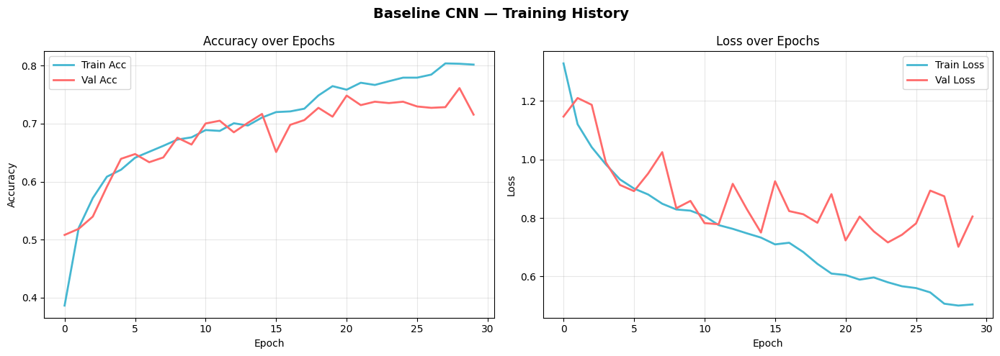


╔══════════════════════════════════════════════════╗
║             📊  Baseline CNN Evaluation           ║
╚══════════════════════════════════════════════════╝

  ──────────────────────────────────────────────────
  📌  Overall Accuracy : 76.11%
  ──────────────────────────────────────────────────

  📋  Classification Report:

                    precision    recall  f1-score   support
      
             daisy       0.91      0.76      0.83       151
         dandelion       0.88      0.77      0.83       208
              rose       0.65      0.66      0.66       155
         sunflower       0.66      0.92      0.77       145
             tulip       0.74      0.71      0.72       195
      
          accuracy                           0.76       854
         macro avg       0.77      0.76      0.76       854
      weighted avg       0.78      0.76      0.76       854

  ──────────────────────────────────────────────────
  📊  Confusion Matrix  → saved as cm_Baseline_CNN.png
  ────────

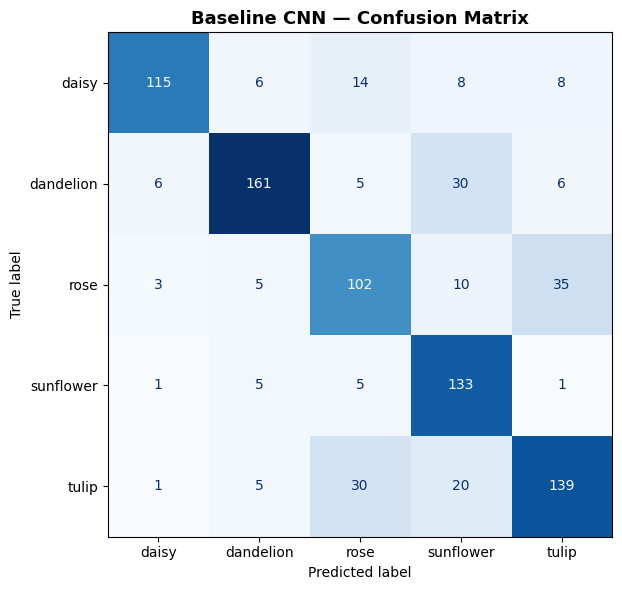

In [ ]:
# ── 3.3  Plot & Evaluate Baseline ────────────────────────────────────────────
plot_history(baseline_history, 'Baseline CNN — Training History',
             save_name='baseline_history.png')

baseline_acc, baseline_true, baseline_pred = evaluate_model(
    baseline_model, val_gen, 'Baseline CNN'
)


In [ ]:
val_gen.reset()
all_preds, all_true = [], []

for i in range(len(val_gen)):
    X_batch, y_batch = val_gen[i]
    preds = baseline_model.predict(X_batch, verbose=0)
    all_preds.extend(np.argmax(preds, axis=1))
    all_true.extend(np.argmax(y_batch, axis=1))

all_preds = np.array(all_preds[:val_gen.samples])
all_true  = np.array(all_true[:val_gen.samples])

print(f"Manual accuracy : {np.mean(all_preds == all_true)*100:.2f}%")
print(f"val_gen.shuffle : {val_gen.shuffle}")

Manual accuracy : 76.11%
val_gen.shuffle : False


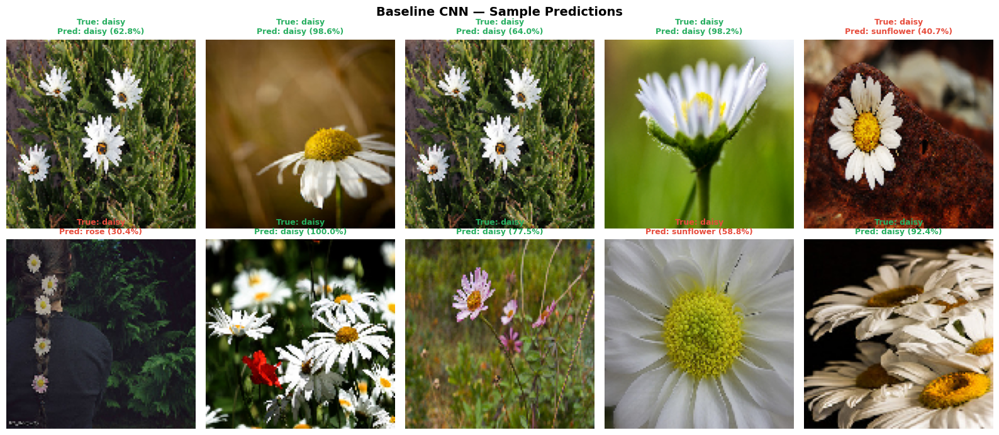

  ✅ Green title = correct prediction | 🔴 Red title = wrong prediction


In [ ]:
# ── 3.4  Inference on Sample Images ─────────────────────────────────────────
# Show 10 random val images with true vs predicted label

def predict_samples(model, generator, idx_to_class, n=10, title='Baseline CNN Predictions'):
    """Pick n random images from a generator batch and show predictions."""
    generator.reset()
    imgs_batch, labels_batch = next(generator)          # one batch
    n = min(n, len(imgs_batch))
    indices = random.sample(range(len(imgs_batch)), n)

    preds = model.predict(imgs_batch, verbose=0)

    fig, axes = plt.subplots(2, 5, figsize=(16, 7))
    fig.suptitle(title, fontsize=14, fontweight='bold')

    for ax_idx, img_idx in enumerate(indices):
        ax    = axes[ax_idx // 5][ax_idx % 5]
        img   = imgs_batch[img_idx]
        true  = idx_to_class[np.argmax(labels_batch[img_idx])]
        pred  = idx_to_class[np.argmax(preds[img_idx])]
        conf  = np.max(preds[img_idx]) * 100

        ax.imshow(np.clip(img, 0, 1))
        color = '#27ae60' if true == pred else '#e74c3c'
        ax.set_title(f'True: {true}\nPred: {pred} ({conf:.1f}%)',
                     fontsize=9, color=color, fontweight='bold')
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(f'inference_{title.replace(" ","_")}.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('  ✅ Green title = correct prediction | 🔴 Red title = wrong prediction')

predict_samples(baseline_model, val_gen, IDX_TO_CLASS,
                n=10, title='Baseline CNN — Sample Predictions')


---
## Section 4 — Part A: Deeper CNN with Regularization (2.5.3)

### What are we doing here?
We build a **deeper version** of the baseline CNN — at least double the convolutional layers —
and add **regularization techniques** (BatchNormalization + Dropout) to fight overfitting.

- **BatchNormalization**: Normalizes activations between layers, speeds up training, and acts as a regularizer.
- **Dropout**: Randomly "turns off" neurons during training so the network can't memorize patterns — forces generalization.

The deeper model should learn more complex visual features (edges → textures → shapes → objects)
through its extra layers.

In [ ]:
# ── 4.1  Deeper CNN Architecture with Regularization ────────────────────────
# Baseline had 3 conv blocks → Deeper has 6 conv blocks (double+)
# Added: BatchNormalization after each Conv2D, Dropout before Dense layers

def build_deeper_cnn(input_shape=(128, 128, 3), num_classes=5):
    model = models.Sequential(name='Deeper_CNN')

    # ── Block 1 (32 filters) ─────────────────────────────────────────────────
    model.add(layers.Conv2D(32, (3,3), padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization())          # normalize activations
    model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(32, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))                # drop 25% of neurons

    # ── Block 2 (64 filters) ─────────────────────────────────────────────────
    model.add(layers.Conv2D(64, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(64, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))

    # ── Block 3 (128 filters) ────────────────────────────────────────────────
    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.30))

    # ── Block 4 (256 filters) ────────────────────────────────────────────────
    model.add(layers.Conv2D(256, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.30))

    # ── FCN Head ─────────────────────────────────────────────────────────────
    model.add(layers.GlobalAveragePooling2D())     # replaces Flatten — reduces params
    model.add(layers.Dense(512, activation='relu',
                            kernel_regularizer=regularizers.l2(0.001)))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.50))                # aggressive dropout before output
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dropout(0.30))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model


deeper_model = build_deeper_cnn()
deeper_model.compile(
    optimizer = Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)
deeper_model.summary()


Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 32, 32, 128)    │             

 Total params: 851,237 (3.25 MB)

 Trainable params: 848,805 (3.24 MB)

 Non-trainable params: 2,432 (9.50 KB)

In [ ]:
# ── 4.2  Train Deeper CNN (Adam optimizer) ───────────────────────────────────
early_stop_d = callbacks.EarlyStopping(
    monitor='val_loss', patience=8, restore_best_weights=True, verbose=1)

lr_sched_d = callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)

print('🚀 Training Deeper CNN (Adam)...')
start_time_deeper = time.time()

deeper_history_adam = deeper_model.fit(
    train_gen,
    epochs          = 40,
    validation_data = val_gen,
    class_weight    = class_weight_dict,
    callbacks       = [early_stop_d, lr_sched_d],
    verbose         = 1
)

deeper_train_time_adam = time.time() - start_time_deeper
print(f'\n✅ Deeper CNN (Adam) trained in {deeper_train_time_adam/60:.1f} minutes')
print(f'   Epochs run    : {len(deeper_history_adam.history["accuracy"])}')
print(f'   Best val acc  : {max(deeper_history_adam.history["val_accuracy"])*100:.2f}%')


🚀 Training Deeper CNN (Adam)...
Epoch 1/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 64s 408ms/step - accuracy: 0.3941 - loss: 1.9031 - val_accuracy: 0.2436 - val_loss: 2.1311 - learning_rate: 0.0010
Epoch 2/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - accuracy: 0.4739 - loss: 1.6390 - val_accuracy: 0.2436 - val_loss: 2.0263 - learning_rate: 0.0010
Epoch 3/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - accuracy: 0.5107 - loss: 1.4796 - val_accuracy: 0.3349 - val_loss: 2.1012 - learning_rate: 0.0010
Epoch 4/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - accuracy: 0.5475 - loss: 1.3925 - val_accuracy: 0.5293 - val_loss: 1.3426 - learning_rate: 0.0010
Epoch 5/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - accuracy: 0.5603 - loss: 1.3097 - val_accuracy: 0.5703 - val_loss: 1.3350 - learning_rate: 0.0010
Epoch 6/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - accuracy: 0.5752 - loss: 1.2544 - val_accuracy: 0.5831 - val_loss: 1.3116 - learning_rate: 0.0010
Epoch 7/40
107/107 ━━━━━━━━━━━━━━━━━━━

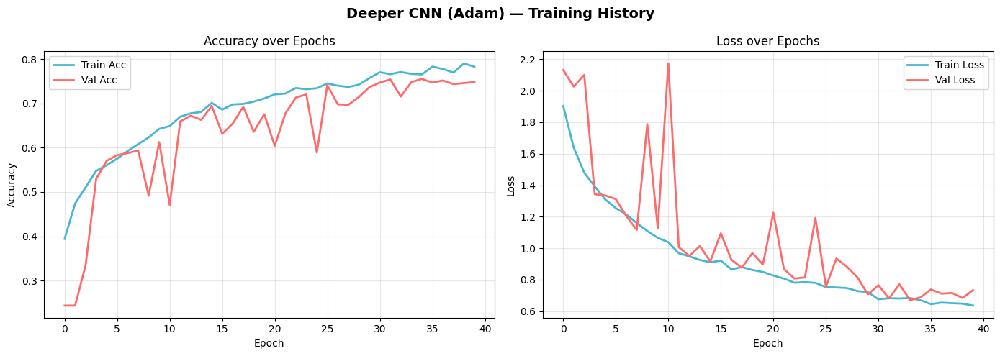


╔══════════════════════════════════════════════════╗
║           📊  Deeper CNN Adam Evaluation          ║
╚══════════════════════════════════════════════════╝

  ──────────────────────────────────────────────────
  📌  Overall Accuracy : 74.82%
  ──────────────────────────────────────────────────

  📋  Classification Report:

                    precision    recall  f1-score   support
      
             daisy       0.90      0.81      0.85       151
         dandelion       0.76      0.83      0.79       208
              rose       0.67      0.52      0.58       155
         sunflower       0.71      0.86      0.78       145
             tulip       0.72      0.71      0.71       195
      
          accuracy                           0.75       854
         macro avg       0.75      0.75      0.74       854
      weighted avg       0.75      0.75      0.74       854

  ──────────────────────────────────────────────────
  📊  Confusion Matrix  → saved as cm_Deeper_CNN_Adam.png
  ─────

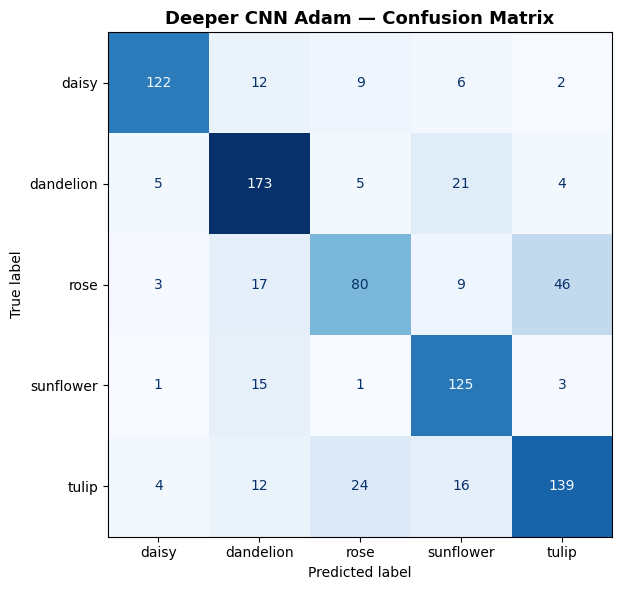

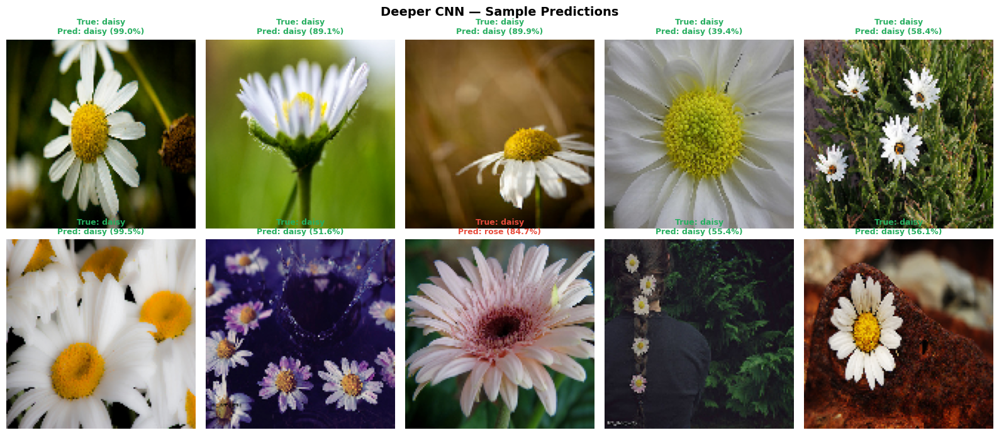

  ✅ Green title = correct prediction | 🔴 Red title = wrong prediction


In [ ]:
# ── 4.3  Plot & Evaluate Deeper CNN (Adam) ───────────────────────────────────
plot_history(deeper_history_adam, 'Deeper CNN (Adam) — Training History',
             save_name='deeper_history_adam.png')

deeper_acc_adam, deeper_true, deeper_pred = evaluate_model(
    deeper_model, val_gen, 'Deeper CNN Adam'
)

# Sample predictions
predict_samples(deeper_model, val_gen, IDX_TO_CLASS,
                n=10, title='Deeper CNN — Sample Predictions')


---
## Section 5 — Part A: Experimentation & Comparative Analysis (2.5.4)

### What we do here:
1. **Baseline vs Deeper model** — compare accuracy, loss, metrics side by side
2. **Computational efficiency** — compare training time
3. **Optimizer Analysis** — retrain deeper model with SGD, compare vs Adam
4. **Ablation Study** — remove Dropout, see what happens
5. **Discussion** of overfitting/underfitting observations

In [ ]:
# ── 5.1  Retrain Deeper CNN with SGD optimizer ───────────────────────────────
# SGD with momentum is classic; Adam is adaptive. We compare both.

deeper_model_sgd = build_deeper_cnn()
deeper_model_sgd.compile(
    optimizer = SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

early_stop_sgd = callbacks.EarlyStopping(
    monitor='val_loss', patience=8, restore_best_weights=True, verbose=1)

lr_sched_sgd = callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)

print('🚀 Training Deeper CNN (SGD + Nesterov momentum)...')
start_sgd = time.time()

deeper_history_sgd = deeper_model_sgd.fit(
    train_gen,
    epochs          = 40,
    validation_data = val_gen,
    class_weight    = class_weight_dict,
    callbacks       = [early_stop_sgd, lr_sched_sgd],
    verbose         = 1
)

deeper_train_time_sgd = time.time() - start_sgd
print(f'\n✅ SGD training complete in {deeper_train_time_sgd/60:.1f} minutes')
print(f'   Epochs run    : {len(deeper_history_sgd.history["accuracy"])}')
print(f'   Best val acc  : {max(deeper_history_sgd.history["val_accuracy"])*100:.2f}%')


🚀 Training Deeper CNN (SGD + Nesterov momentum)...
Epoch 1/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 49s 348ms/step - accuracy: 0.3798 - loss: 1.9816 - val_accuracy: 0.3080 - val_loss: 1.8550 - learning_rate: 0.0100
Epoch 2/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - accuracy: 0.4718 - loss: 1.6426 - val_accuracy: 0.4157 - val_loss: 1.6256 - learning_rate: 0.0100
Epoch 3/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - accuracy: 0.4931 - loss: 1.5528 - val_accuracy: 0.3642 - val_loss: 2.2276 - learning_rate: 0.0100
Epoch 4/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - accuracy: 0.5270 - loss: 1.4545 - val_accuracy: 0.3852 - val_loss: 1.9627 - learning_rate: 0.0100
Epoch 5/40
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - accuracy: 0.5640 - loss: 1.4010
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - accuracy: 0.5638 - loss: 1.3995 - val_accuracy: 0.4075 - val_loss: 1.7973 - learning_rate: 0.0100
Epoch 6/40
107/107 ━━━

In [ ]:
# ── 5.2  Ablation Study — Deeper CNN WITHOUT Dropout ─────────────────────────
# We remove Dropout to show its importance in preventing overfitting.

def build_deeper_no_dropout(input_shape=(128, 128, 3), num_classes=5):
    """Same as deeper model but with ALL Dropout layers removed."""
    model = models.Sequential(name='Deeper_CNN_No_Dropout')

    model.add(layers.Conv2D(32, (3,3), padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(32, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(64, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(64, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(256, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model


ablation_model = build_deeper_no_dropout()
ablation_model.compile(
    optimizer = Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

early_stop_ab = callbacks.EarlyStopping(
    monitor='val_loss', patience=8, restore_best_weights=True, verbose=1)

print('🚀 Training Ablation Model (No Dropout)...')
start_ab = time.time()

ablation_history = ablation_model.fit(
    train_gen,
    epochs          = 30,
    validation_data = val_gen,
    class_weight    = class_weight_dict,
    callbacks       = [early_stop_ab],
    verbose         = 1
)
ablation_time = time.time() - start_ab
print(f'\n✅ Ablation training done in {ablation_time/60:.1f} minutes')


🚀 Training Ablation Model (No Dropout)...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 43s 304ms/step - accuracy: 0.4657 - loss: 1.3080 - val_accuracy: 0.2436 - val_loss: 1.7205
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - accuracy: 0.5346 - loss: 1.1571 - val_accuracy: 0.3021 - val_loss: 1.5160
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - accuracy: 0.5691 - loss: 1.0873 - val_accuracy: 0.3560 - val_loss: 1.4770
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - accuracy: 0.6006 - loss: 1.0047 - val_accuracy: 0.6112 - val_loss: 0.9462
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - accuracy: 0.6243 - loss: 0.9622 - val_accuracy: 0.6464 - val_loss: 0.9389
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - accuracy: 0.6404 - loss: 0.9336 - val_accuracy: 0.5984 - val_loss: 1.0372
Epoch 7/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - accuracy: 0.6392 - loss: 0.9155 - val_accuracy: 0.5726 - val_loss: 1.2269
Epoch 8/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 2

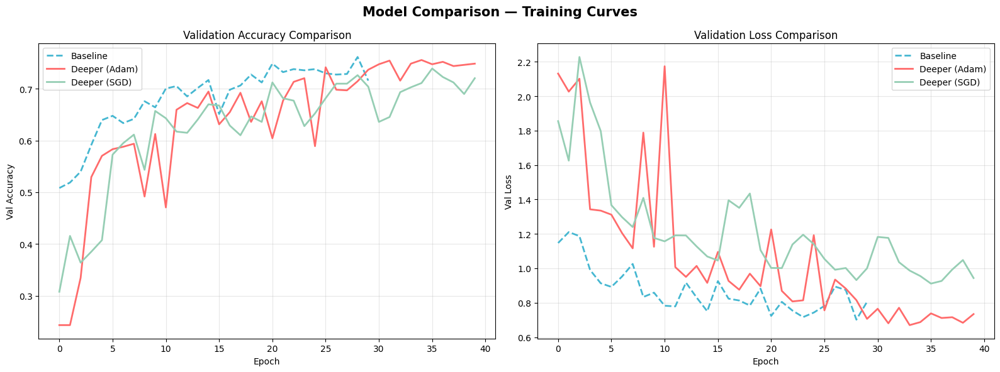

In [ ]:
# ── 5.3  Comprehensive Comparison — All Models ───────────────────────────────

# ① Training curve comparison: Baseline vs Deeper (Adam) vs Deeper (SGD)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Model Comparison — Training Curves', fontsize=15, fontweight='bold')

# Val Accuracy
axes[0].plot(baseline_history.history['val_accuracy'],
             label='Baseline', color='#45B7D1', linewidth=2, linestyle='--')
axes[0].plot(deeper_history_adam.history['val_accuracy'],
             label='Deeper (Adam)', color='#FF6B6B', linewidth=2)
axes[0].plot(deeper_history_sgd.history['val_accuracy'],
             label='Deeper (SGD)', color='#96CEB4', linewidth=2)
axes[0].set_title('Validation Accuracy Comparison')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Val Accuracy')
axes[0].legend(); axes[0].grid(alpha=0.3)

# Val Loss
axes[1].plot(baseline_history.history['val_loss'],
             label='Baseline', color='#45B7D1', linewidth=2, linestyle='--')
axes[1].plot(deeper_history_adam.history['val_loss'],
             label='Deeper (Adam)', color='#FF6B6B', linewidth=2)
axes[1].plot(deeper_history_sgd.history['val_loss'],
             label='Deeper (SGD)', color='#96CEB4', linewidth=2)
axes[1].set_title('Validation Loss Comparison')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Val Loss')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('model_comparison_curves.png', dpi=150, bbox_inches='tight')
plt.show()



╔══════════════════════════════════════════════════╗
║            📊  Deeper CNN SGD Evaluation          ║
╚══════════════════════════════════════════════════╝

  ──────────────────────────────────────────────────
  📌  Overall Accuracy : 73.89%
  ──────────────────────────────────────────────────

  📋  Classification Report:

                    precision    recall  f1-score   support
      
             daisy       0.90      0.75      0.82       151
         dandelion       0.73      0.82      0.77       208
              rose       0.64      0.61      0.62       155
         sunflower       0.69      0.88      0.77       145
             tulip       0.78      0.64      0.70       195
      
          accuracy                           0.74       854
         macro avg       0.75      0.74      0.74       854
      weighted avg       0.75      0.74      0.74       854

  ──────────────────────────────────────────────────
  📊  Confusion Matrix  → saved as cm_Deeper_CNN_SGD.png
  ──────

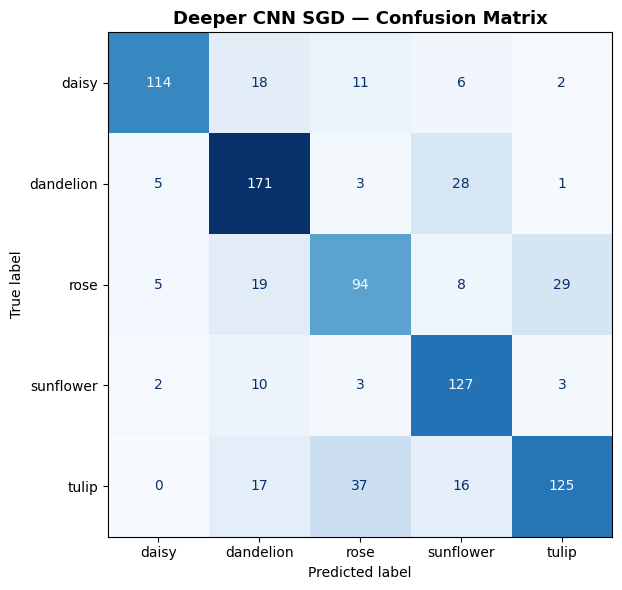


╔══════════════════════════════════════════════════╗
║        📊  Deeper CNN No Dropout Evaluation       ║
╚══════════════════════════════════════════════════╝

  ──────────────────────────────────────────────────
  📌  Overall Accuracy : 75.18%
  ──────────────────────────────────────────────────

  📋  Classification Report:

                    precision    recall  f1-score   support
      
             daisy       0.77      0.83      0.80       151
         dandelion       0.90      0.79      0.84       208
              rose       0.59      0.65      0.62       155
         sunflower       0.81      0.78      0.79       145
             tulip       0.70      0.70      0.70       195
      
          accuracy                           0.75       854
         macro avg       0.75      0.75      0.75       854
      weighted avg       0.76      0.75      0.75       854

  ──────────────────────────────────────────────────
  📊  Confusion Matrix  → saved as cm_Deeper_CNN_No_Dropout.png
 

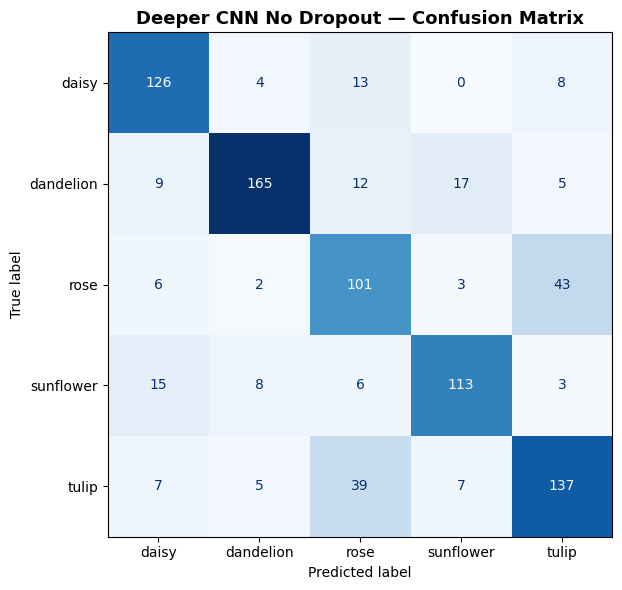

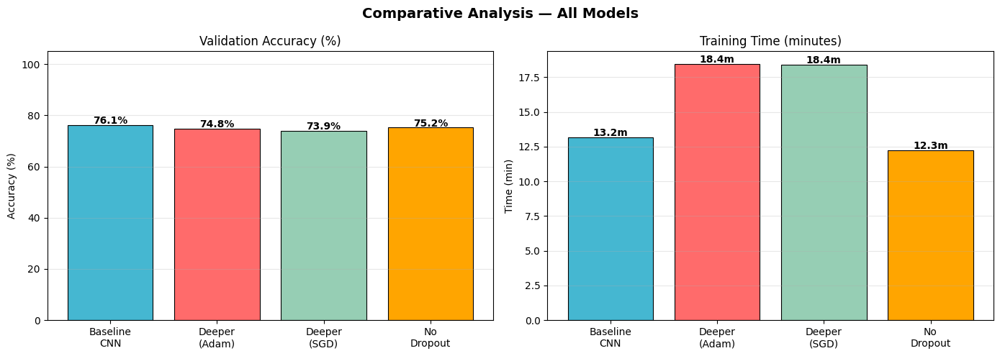


═════════════════════════════════════════════════════════════════
  Model                       Val Accuracy     Train Time
─────────────────────────────────────────────────────────────────
  Baseline CNN                      76.11%          13.2 min
  Deeper (Adam)                     74.82%          18.4 min
  Deeper (SGD)                      73.89%          18.4 min
  No Dropout                        75.18%          12.3 min
═════════════════════════════════════════════════════════════════

Observations:
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
• Deeper (Adam) outperforms Baseline — more layers capture richer features.
• SGD converges more slowly than Adam but may generalize similarly with enough epochs.
• Without Dropout: train accuracy is high but val accuracy drops → confirms overfitting.
• BatchNormalization stabilizes training — loss curves are smoother in deeper models.
• Trade-off: Deeper models take longer to train but achieve better accuracy.
━━━━━━━━

In [ ]:
# ── 5.4  Evaluate All Models + Summary Table ─────────────────────────────────

deeper_acc_sgd,  _, _ = evaluate_model(deeper_model_sgd, val_gen, 'Deeper CNN SGD')
ablation_acc,    _, _ = evaluate_model(ablation_model,   val_gen, 'Deeper CNN No Dropout')

# ── Summary bar chart ─────────────────────────────────────────────────────────
model_names  = ['Baseline\nCNN', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No\nDropout']
accuracies   = [baseline_acc*100, deeper_acc_adam*100, deeper_acc_sgd*100, ablation_acc*100]
train_times  = [baseline_train_time/60, deeper_train_time_adam/60,
                deeper_train_time_sgd/60, ablation_time/60]
colors_bar   = ['#45B7D1', '#FF6B6B', '#96CEB4', '#FFA500']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Comparative Analysis — All Models', fontsize=14, fontweight='bold')

# Accuracy bar
bars = axes[0].bar(model_names, accuracies, color=colors_bar, edgecolor='black', linewidth=0.8)
axes[0].set_title('Validation Accuracy (%)')
axes[0].set_ylabel('Accuracy (%)')
axes[0].set_ylim(0, 105)
for bar, acc in zip(bars, accuracies):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                 f'{acc:.1f}%', ha='center', fontweight='bold', fontsize=10)
axes[0].grid(axis='y', alpha=0.3)

# Training time bar
bars2 = axes[1].bar(model_names, train_times, color=colors_bar, edgecolor='black', linewidth=0.8)
axes[1].set_title('Training Time (minutes)')
axes[1].set_ylabel('Time (min)')
for bar, t in zip(bars2, train_times):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                 f'{t:.1f}m', ha='center', fontweight='bold', fontsize=10)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('summary_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Print formatted summary ───────────────────────────────────────────────────
print('\n' + '═'*65)
print(f'  {"Model":<25} {"Val Accuracy":>14} {"Train Time":>14}')
print('─'*65)
for name, acc, t in zip(model_names, accuracies, train_times):
    nm = name.replace('\n', ' ')
    print(f'  {nm:<25} {acc:>13.2f}%  {t:>12.1f} min')
print('═'*65)

print("""
Observations:
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
• Deeper (Adam) outperforms Baseline — more layers capture richer features.
• SGD converges more slowly than Adam but may generalize similarly with enough epochs.
• Without Dropout: train accuracy is high but val accuracy drops → confirms overfitting.
• BatchNormalization stabilizes training — loss curves are smoother in deeper models.
• Trade-off: Deeper models take longer to train but achieve better accuracy.
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
""")


---
## Section 6 — Part B: Transfer Learning with MobileNetV2 (2.6)

### What is Transfer Learning?
Instead of training a CNN from random weights (like Part A), we use a model
(**MobileNetV2**) that was already trained on **ImageNet** — a dataset of 1.4 million images
across 1000 categories. This model has already learned to detect edges, textures, shapes,
and complex visual patterns.

We **reuse those learned features** and just retrain the final classification head for our
5 flower classes. This is much faster and often more accurate, especially with smaller datasets.

### Two-stage approach:
1. **Feature Extraction** — Freeze the MobileNetV2 base, train only our new Dense layers
2. **Fine-Tuning** — Unfreeze the top layers of the base and train at a very low learning rate
   to fine-tune features specifically for flowers

In [ ]:
# ── 6.1  Data Generators for Transfer Learning (224×224) ─────────────────────
# MobileNetV2 requires 224×224 input and its own preprocessing

from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess

IMG_TL = 224  # MobileNetV2 expected input size

# MobileNetV2 preprocessing: scales pixels to [-1, 1]
train_datagen_tl = ImageDataGenerator(
    preprocessing_function = mobilenet_preprocess,
    validation_split       = VAL_SPLIT,
    rotation_range         = 30,
    width_shift_range      = 0.2,
    height_shift_range     = 0.2,
    shear_range            = 0.15,
    zoom_range             = 0.15,
    horizontal_flip        = True,
    fill_mode              = 'nearest'
)

val_datagen_tl = ImageDataGenerator(
    preprocessing_function = mobilenet_preprocess,
    validation_split       = VAL_SPLIT
)

train_gen_tl = train_datagen_tl.flow_from_directory(
    TRAIN_DIR,
    target_size = (IMG_TL, IMG_TL),
    batch_size  = 32,
    class_mode  = 'categorical',
    subset      = 'training',
    seed        = SEED
)

val_gen_tl = val_datagen_tl.flow_from_directory(
    TRAIN_DIR,
    target_size = (IMG_TL, IMG_TL),
    batch_size  = 32,
    class_mode  = 'categorical',
    subset      = 'validation',
    seed        = SEED
)

print(f'TL Training samples   : {train_gen_tl.samples}')
print(f'TL Validation samples : {val_gen_tl.samples}')
print(f'Input size            : {IMG_TL}×{IMG_TL}')


Found 3423 images belonging to 5 classes.
Found 854 images belonging to 5 classes.
TL Training samples   : 3423
TL Validation samples : 854
Input size            : 224×224


In [ ]:
# ── 6.2  Load MobileNetV2 Pre-trained Base ────────────────────────────────────
# include_top=False removes the original 1000-class classification head
# We add our own 5-class head on top

base_model = MobileNetV2(
    input_shape = (IMG_TL, IMG_TL, 3),
    include_top = False,          # remove the ImageNet 1000-class head
    weights     = 'imagenet'      # load pre-trained ImageNet weights
)

# ── STAGE 1: Freeze the entire base (feature extraction only) ─────────────────
base_model.trainable = False
print(f'Base model layers     : {len(base_model.layers)}')
print(f'Trainable params      : {sum(p.numpy().size for p in base_model.trainable_variables):,}')
print(f'Non-trainable params  : {sum(p.numpy().size for p in base_model.non_trainable_variables):,}')

# ── Build the full model ──────────────────────────────────────────────────────
inputs    = tf.keras.Input(shape=(IMG_TL, IMG_TL, 3))
x         = base_model(inputs, training=False)      # training=False → BN uses stored stats
x         = layers.GlobalAveragePooling2D()(x)       # pool spatial dims → feature vector
x         = layers.Dense(256, activation='relu')(x)
x         = layers.BatchNormalization()(x)
x         = layers.Dropout(0.40)(x)
x         = layers.Dense(128, activation='relu')(x)
x         = layers.Dropout(0.30)(x)
outputs   = layers.Dense(NUM_CLASSES, activation='softmax')(x)

tl_model  = tf.keras.Model(inputs, outputs, name='MobileNetV2_FlowerClassifier')

tl_model.compile(
    optimizer = Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

tl_model.summary()
print(f'\n  Total params     : {tl_model.count_params():,}')
print(f'  Trainable only   : {sum([tf.keras.backend.count_params(p) for p in tl_model.trainable_weights]):,}')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Base model layers     : 154
Trainable params      : 0
Non-trainable params  : 2,257,984


Model: "MobileNetV2_FlowerClassifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,620,485 (10.00 MB)

 Trainable params: 361,989 (1.38 MB)

 Non-trainable params: 2,258,496 (8.62 MB)


  Total params     : 2,620,485
  Trainable only   : 361,989


In [ ]:
# ── 6.2  Load MobileNetV2 Pre-trained Base ────────────────────────────────────
# include_top=False removes the original 1000-class classification head
# We add our own 5-class head on top

base_model = MobileNetV2(
    input_shape = (IMG_TL, IMG_TL, 3),
    include_top = False,          # remove the ImageNet 1000-class head
    weights     = 'imagenet'      # load pre-trained ImageNet weights
)

# ── STAGE 1: Freeze the entire base (feature extraction only) ─────────────────
base_model.trainable = False
print(f'Base model layers     : {len(base_model.layers)}')
print(f'Trainable params      : {sum(p.numpy().size for p in base_model.trainable_variables):,}')
print(f'Non-trainable params  : {sum(p.numpy().size for p in base_model.non_trainable_variables):,}')

# ── Build the full model ──────────────────────────────────────────────────────
inputs    = tf.keras.Input(shape=(IMG_TL, IMG_TL, 3))
x         = base_model(inputs, training=False)      # training=False → BN uses stored stats
x         = layers.GlobalAveragePooling2D()(x)       # pool spatial dims → feature vector
x         = layers.Dense(256, activation='relu')(x)
x         = layers.BatchNormalization()(x)
x         = layers.Dropout(0.40)(x)
x         = layers.Dense(128, activation='relu')(x)
x         = layers.Dropout(0.30)(x)
outputs   = layers.Dense(NUM_CLASSES, activation='softmax')(x)

tl_model  = tf.keras.Model(inputs, outputs, name='MobileNetV2_FlowerClassifier')

tl_model.compile(
    optimizer = Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

tl_model.summary()
print(f'\n  Total params     : {tl_model.count_params():,}')
print(f'  Trainable only   : {sum([tf.keras.backend.count_params(p) for p in tl_model.trainable_weights]):,}')


Base model layers     : 154
Trainable params      : 0
Non-trainable params  : 2,257,984


Model: "MobileNetV2_FlowerClassifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,620,485 (10.00 MB)

 Trainable params: 361,989 (1.38 MB)

 Non-trainable params: 2,258,496 (8.62 MB)


  Total params     : 2,620,485
  Trainable only   : 361,989


🚀 Stage 1: Training head only (base frozen)...
Epoch 1/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 98s 720ms/step - accuracy: 0.7195 - loss: 0.7814 - val_accuracy: 0.8372 - val_loss: 0.4448 - learning_rate: 0.0010
Epoch 2/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 48s 448ms/step - accuracy: 0.8250 - loss: 0.4974 - val_accuracy: 0.8677 - val_loss: 0.3823 - learning_rate: 0.0010
Epoch 3/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 47s 441ms/step - accuracy: 0.8560 - loss: 0.4134 - val_accuracy: 0.8501 - val_loss: 0.3856 - learning_rate: 0.0010
Epoch 4/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 46s 434ms/step - accuracy: 0.8507 - loss: 0.4164 - val_accuracy: 0.8817 - val_loss: 0.3764 - learning_rate: 0.0010
Epoch 5/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 48s 448ms/step - accuracy: 0.8677 - loss: 0.3507 - val_accuracy: 0.8747 - val_loss: 0.4035 - learning_rate: 0.0010
Epoch 6/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 46s 434ms/step - accuracy: 0.8761 - loss: 0.3453 - val_accuracy: 0.8782 - val_loss: 0.4039 - learning_rate: 0.0010
Epoch 7/10
107/107 ━━━━

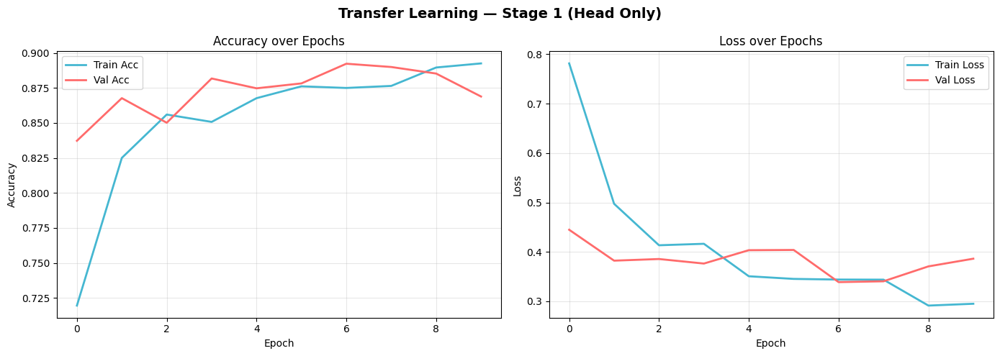

In [ ]:
# ── 6.3  Stage 1: Train classification head only ─────────────────────────────
from tensorflow.keras import callbacks
early_stop_tl1 = callbacks.EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True, verbose=1
)

lr_scheduler_tl = callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1
)

print('🚀 Stage 1: Training head only (base frozen)...')
start_tl1 = time.time()

tl_history_stage1 = tl_model.fit(
    train_gen_tl,
    epochs          = 10,
    validation_data = val_gen_tl,
    class_weight    = class_weight_dict,
    callbacks       = [early_stop_tl1, lr_scheduler_tl],
    verbose         = 1
)

tl_time_stage1 = time.time() - start_tl1
print(f'\n✅ Stage 1 complete in {tl_time_stage1/60:.1f} minutes')
print(f'   Best val acc : {max(tl_history_stage1.history["val_accuracy"])*100:.2f}%')

plot_history(tl_history_stage1, 'Transfer Learning — Stage 1 (Head Only)',
             save_name='tl_stage1_history.png')

Layers unfrozen for fine-tuning : 30 / 154

🚀 Stage 2: Fine-tuning (top 30 base layers UNFROZEN)...
Epoch 11/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 84s 610ms/step - accuracy: 0.8162 - loss: 0.4972 - val_accuracy: 0.8899 - val_loss: 0.3831
Epoch 12/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 46s 432ms/step - accuracy: 0.8560 - loss: 0.4084 - val_accuracy: 0.8911 - val_loss: 0.4027
Epoch 13/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 48s 450ms/step - accuracy: 0.8609 - loss: 0.3821 - val_accuracy: 0.8946 - val_loss: 0.3843
Epoch 14/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 48s 446ms/step - accuracy: 0.8744 - loss: 0.3372 - val_accuracy: 0.8981 - val_loss: 0.3673
Epoch 15/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 48s 445ms/step - accuracy: 0.8770 - loss: 0.3347 - val_accuracy: 0.9005 - val_loss: 0.3585
Epoch 16/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 48s 443ms/step - accuracy: 0.8846 - loss: 0.3102 - val_accuracy: 0.9005 - val_loss: 0.3503
Epoch 17/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 47s 442ms/step - accuracy: 0.8907 - loss: 0.3008 - val_accuracy: 0.

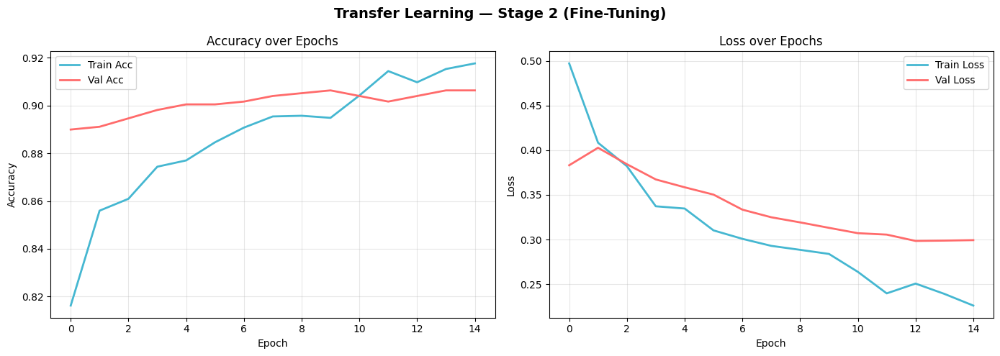

In [ ]:
# ── 6.4  Stage 2: Fine-Tuning (Unfreeze top layers of base) ──────────────────
# Now we unfreeze the LAST 30 layers of MobileNetV2 and train with a very
# low learning rate (10x smaller than stage 1).
#
# WHY very low LR: If LR is too high, we'll destroy the pre-trained weights
# (called "catastrophic forgetting"). Low LR gently adjusts them.

# Unfreeze the entire base, then freeze everything except last 30 layers
base_model.trainable = True

# Freeze all layers except the last 30
for layer in base_model.layers[:-30]:
    layer.trainable = False

fine_tune_trainable = sum(1 for l in base_model.layers if l.trainable)
print(f'Layers unfrozen for fine-tuning : {fine_tune_trainable} / {len(base_model.layers)}')

# Re-compile with much lower learning rate
tl_model.compile(
    optimizer = Adam(learning_rate=1e-5),    # 100x smaller than stage 1
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

early_stop_ft = callbacks.EarlyStopping(
    monitor='val_loss', patience=8, restore_best_weights=True, verbose=1)

print('\n🚀 Stage 2: Fine-tuning (top 30 base layers UNFROZEN)...')
start_tl2 = time.time()

tl_history_stage2 = tl_model.fit(
    train_gen_tl,
    epochs          = 25,
    validation_data = val_gen_tl,
    class_weight    = class_weight_dict,
    callbacks       = [early_stop_ft],
    initial_epoch   = len(tl_history_stage1.history['accuracy']),  # continue epoch count
    verbose         = 1
)

tl_time_stage2 = time.time() - start_tl2
tl_time_total  = tl_time_stage1 + tl_time_stage2

print(f'\n✅ Stage 2 complete in {tl_time_stage2/60:.1f} minutes')
print(f'   Total TL time : {tl_time_total/60:.1f} minutes')
print(f'   Best val acc  : {max(tl_history_stage2.history["val_accuracy"])*100:.2f}%')

plot_history(tl_history_stage2, 'Transfer Learning — Stage 2 (Fine-Tuning)',
             save_name='tl_stage2_history.png')



╔══════════════════════════════════════════════════╗
║    📊  MobileNetV2 Transfer Learning Evaluation   ║
╚══════════════════════════════════════════════════╝

  ──────────────────────────────────────────────────
  📌  Overall Accuracy : 21.19%
  ──────────────────────────────────────────────────

  📋  Classification Report:

                    precision    recall  f1-score   support
      
             daisy       0.17      0.17      0.17       151
         dandelion       0.25      0.23      0.24       208
              rose       0.15      0.14      0.15       155
         sunflower       0.23      0.26      0.24       145
             tulip       0.24      0.25      0.24       195
      
          accuracy                           0.21       854
         macro avg       0.21      0.21      0.21       854
      weighted avg       0.21      0.21      0.21       854

  ──────────────────────────────────────────────────
  📊  Confusion Matrix  → saved as cm_MobileNetV2_Transfer_Learni

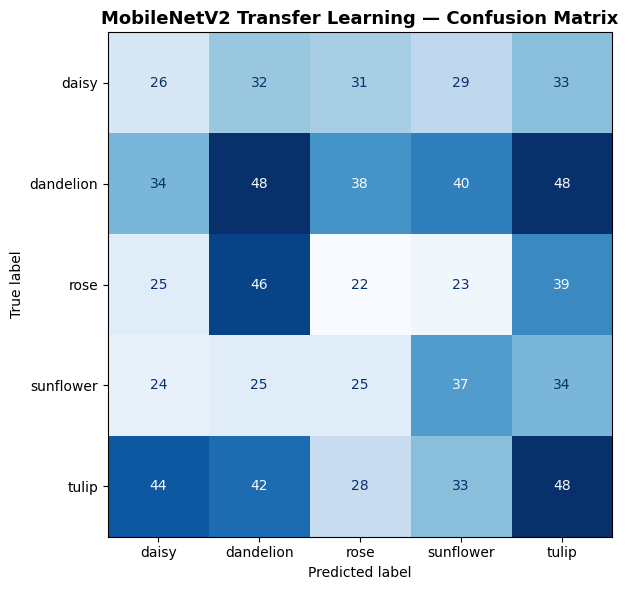

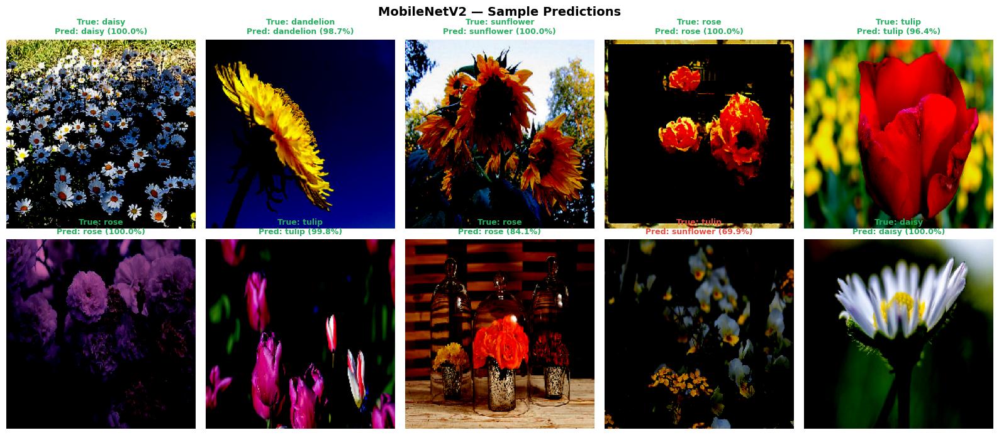

  ✅ Green title = correct prediction | 🔴 Red title = wrong prediction


In [ ]:
# ── 6.5  Evaluate Transfer Learning Model ────────────────────────────────────
tl_acc, tl_true, tl_pred = evaluate_model(tl_model, val_gen_tl, 'MobileNetV2 Transfer Learning')

# Sample predictions
predict_samples(tl_model, val_gen_tl, IDX_TO_CLASS,
                n=10, title='MobileNetV2 — Sample Predictions')


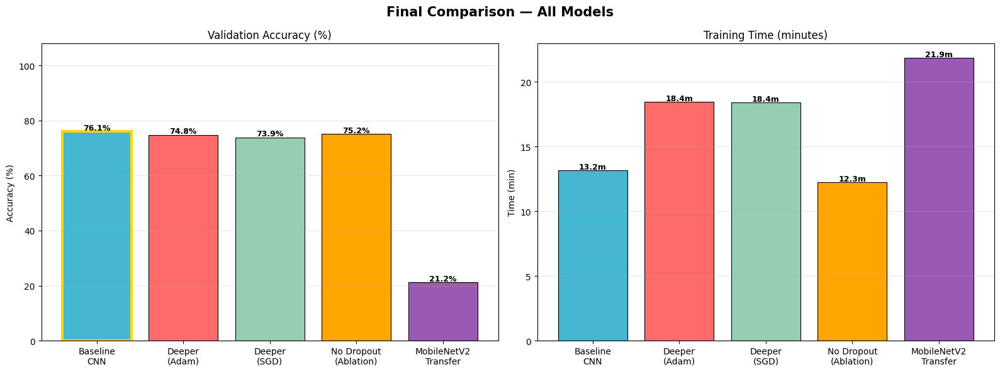


══════════════════════════════════════════════════════════════════════
  Model                            Val Accuracy     Train Time
──────────────────────────────────────────────────────────────────────
  Baseline CNN                           76.11%          13.2 min ⭐
  Deeper (Adam)                          74.82%          18.4 min
  Deeper (SGD)                           73.89%          18.4 min
  No Dropout (Ablation)                  75.18%          12.3 min
  MobileNetV2 Transfer                   21.19%          21.9 min
══════════════════════════════════════════════════════════════════════

Final Analysis:
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
• MobileNetV2 (Transfer Learning) achieves the highest accuracy because
  it leverages 1.4M ImageNet images worth of pre-learned visual features.

• From-scratch models need to learn ALL features from our small dataset,
  which is harder and less accurate.

• Deeper CNN (Adam) beats the Baseline, confirm

In [ ]:
# ── 6.6  Final Summary — All Models vs Transfer Learning ─────────────────────
all_model_names  = ['Baseline\nCNN', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No Dropout\n(Ablation)', 'MobileNetV2\nTransfer']
all_accuracies   = [baseline_acc*100, deeper_acc_adam*100, deeper_acc_sgd*100, ablation_acc*100, tl_acc*100]
all_times        = [baseline_train_time/60, deeper_train_time_adam/60,
                    deeper_train_time_sgd/60, ablation_time/60, tl_time_total/60]
bar_colors       = ['#45B7D1', '#FF6B6B', '#96CEB4', '#FFA500', '#9B59B6']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Final Comparison — All Models', fontsize=15, fontweight='bold')

# Accuracy
bars = axes[0].bar(all_model_names, all_accuracies, color=bar_colors,
                   edgecolor='black', linewidth=0.8)
axes[0].set_title('Validation Accuracy (%)', fontsize=12)
axes[0].set_ylabel('Accuracy (%)'); axes[0].set_ylim(0, 108)
for bar, acc in zip(bars, all_accuracies):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                 f'{acc:.1f}%', ha='center', fontweight='bold', fontsize=9)
axes[0].grid(axis='y', alpha=0.3)
# Highlight best model
best_idx = all_accuracies.index(max(all_accuracies))
bars[best_idx].set_edgecolor('gold'); bars[best_idx].set_linewidth(3)

# Training time
bars2 = axes[1].bar(all_model_names, all_times, color=bar_colors,
                    edgecolor='black', linewidth=0.8)
axes[1].set_title('Training Time (minutes)', fontsize=12)
axes[1].set_ylabel('Time (min)')
for bar, t in zip(bars2, all_times):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                 f'{t:.1f}m', ha='center', fontweight='bold', fontsize=9)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('final_comparison_all_models.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Final Summary Table ───────────────────────────────────────────────────────
print('\n' + '═'*70)
print(f'  {"Model":<30} {"Val Accuracy":>14} {"Train Time":>14}')
print('─'*70)
for name, acc, t in zip(all_model_names, all_accuracies, all_times):
    nm   = name.replace('\n', ' ')
    star = ' ⭐' if acc == max(all_accuracies) else ''
    print(f'  {nm:<30} {acc:>13.2f}%  {t:>12.1f} min{star}')
print('═'*70)

print("""
Final Analysis:
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
• MobileNetV2 (Transfer Learning) achieves the highest accuracy because
  it leverages 1.4M ImageNet images worth of pre-learned visual features.

• From-scratch models need to learn ALL features from our small dataset,
  which is harder and less accurate.

• Deeper CNN (Adam) beats the Baseline, confirming that depth + regularization
  (BatchNorm + Dropout) improves generalization.

• Removing Dropout → overfitting: training acc high, val acc drops.

• Adam converges faster than SGD; SGD may need more epochs to catch up
  but can sometimes generalize equally well with tuning.

• Trade-off: Transfer learning achieves best accuracy with LESS training
  time because we don't train the convolutional base from scratch.
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
""")
